In [1]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv("reliance_stock.csv")
data.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,29.684193,28802010.0
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,32.060585,61320457.0
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,33.316597,173426953.0
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,34.714115,101355113.0
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,37.096405,128426756.0


In [3]:
data.shape

(5755, 7)

In [4]:
#Checking duplicate values.
data.duplicated().sum()

0

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5755 entries, 0 to 5754
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       5755 non-null   object 
 1   Open       5745 non-null   float64
 2   High       5745 non-null   float64
 3   Low        5745 non-null   float64
 4   Close      5745 non-null   float64
 5   Adj Close  5745 non-null   float64
 6   Volume     5745 non-null   float64
dtypes: float64(6), object(1)
memory usage: 314.9+ KB


In [6]:
#Converting the Data datatype to datetime.
data["Date"] = pd.to_datetime(data['Date'])

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5755 entries, 0 to 5754
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       5755 non-null   datetime64[ns]
 1   Open       5745 non-null   float64       
 2   High       5745 non-null   float64       
 3   Low        5745 non-null   float64       
 4   Close      5745 non-null   float64       
 5   Adj Close  5745 non-null   float64       
 6   Volume     5745 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 314.9 KB


In [8]:
#Describe numerical variables.
data.describe()

,Date,Open,High,Low,Close,Adj Close,Volume
count,5755,5745.000000,5745.000000,5745.000000,5745.000000,5745.000000,5.745000e+03
mean,2011-05-23 11:09:34.874022656,638.461095,646.283828,630.097175,637.879417,615.592615,1.681692e+07
min,2000-01-03 00:00:00,31.796223,33.962387,30.504259,31.440351,23.964357,0.000000e+00
25%,2005-07-13 12:00:00,101.221848,103.666519,99.837044,101.291473,89.115646,6.334809e+06
50%,2011-05-11 00:00:00,446.368866,450.975220,440.573792,446.145996,418.400177,1.016516e+07
75%,2017-03-07 12:00:00,681.056763,690.801880,668.661743,675.992249,638.090271,2.036854e+07
max,2022-12-30 00:00:00,2856.149902,2856.149902,2786.100098,2819.850098,2811.385742,2.918015e+08
std,NaN,679.735286,687.198000,671.907024,679.242266,682.151473,1.809928e+07


In [9]:
#Checking null values
data.isna().sum()

Date          0
Open         10
High         10
Low          10
Close        10
Adj Close    10
Volume       10
dtype: int64

In [10]:
#drop the null values
data = data.dropna()
data.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

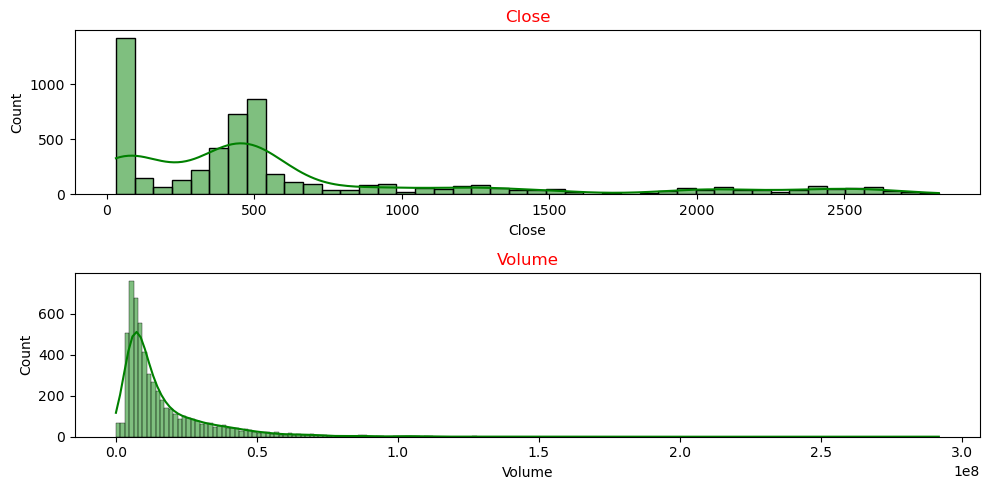

In [11]:
#Checking the data is skewed or not for imputation

plt.figure(figsize=(10,5))
plt.subplot(211)
sns.histplot(data['Close'], kde=True, color='green')
plt.title('Close', color='red')
plt.subplot(212)
sns.histplot(data['Volume'], kde=True, color='green')
plt.title('Volume', color='red')
plt.tight_layout()

In [12]:
#Checking correlation.
data.corr()

,Date,Open,High,Low,Close,Adj Close,Volume
Date,1.000000,0.827593,0.827497,0.827858,0.827665,0.826029,-0.495332
Open,0.827593,1.000000,0.999870,0.999861,0.999731,0.999499,-0.323025
High,0.827497,0.999870,1.000000,0.999825,0.999892,0.999633,-0.321129
Low,0.827858,0.999861,0.999825,1.000000,0.999883,0.999691,-0.324540
Close,0.827665,0.999731,0.999892,0.999883,1.000000,0.999772,-0.322671
Adj Close,0.826029,0.999499,0.999633,0.999691,0.999772,1.000000,-0.317065
Volume,-0.495332,-0.323025,-0.321129,-0.324540,-0.322671,-0.317065,1.000000


<Axes: >

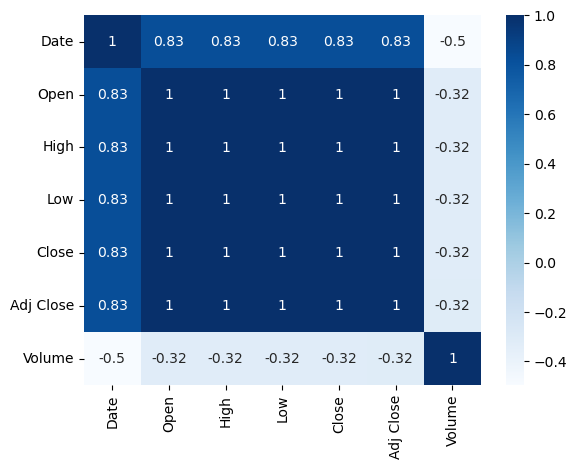

In [13]:
#Correlation using heatmap
sns.heatmap(data.corr(), annot = True, cmap='Blues')

In [14]:
#Extracting 'Month' and 'Year' from 'Date' variable.

data['Month'] = data.Date.dt.strftime("%b")
data['Year'] = data.Date.dt.strftime("%Y")
data

,Date,Open,High,Low,Close,Adj Close,Volume,Month,Year
0,2000-01-03,36.747459,38.944569,36.747459,38.944569,29.684193,28802010.0,Jan,2000
1,2000-01-04,39.981236,42.062302,38.882679,42.062302,32.060585,61320457.0,Jan,2000
2,2000-01-05,39.710464,44.545658,39.710464,43.710136,33.316597,173426953.0,Jan,2000
3,2000-01-06,44.715855,46.526150,44.715855,45.543640,34.714115,101355113.0,Jan,2000
4,2000-01-07,45.644211,49.187443,45.334759,48.669109,37.096405,128426756.0,Jan,2000
...,...,...,...,...,...,...,...,...,...
5750,2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2524.050049,2764496.0,Dec,2022
5751,2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2544.699951,2659749.0,Dec,2022
5752,2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,2544.449951,3442509.0,Dec,2022
5753,2022-12-29,2527.000000,2548.899902,2525.500000,2543.300049,2543.300049,3198493.0,Dec,2022


In [15]:
#Set 'DATE' as a index.
data.set_index('Date', inplace=True)
data

,Open,High,Low,Close,Adj Close,Volume,Month,Year
Date,,,,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,29.684193,28802010.0,Jan,2000
2000-01-04,39.981236,42.062302,38.882679,42.062302,32.060585,61320457.0,Jan,2000
2000-01-05,39.710464,44.545658,39.710464,43.710136,33.316597,173426953.0,Jan,2000
2000-01-06,44.715855,46.526150,44.715855,45.543640,34.714115,101355113.0,Jan,2000
2000-01-07,45.644211,49.187443,45.334759,48.669109,37.096405,128426756.0,Jan,2000
...,...,...,...,...,...,...,...,...
2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2524.050049,2764496.0,Dec,2022
2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2544.699951,2659749.0,Dec,2022
2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,2544.449951,3442509.0,Dec,2022


# Visualization

In [16]:
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
sns.set_style('darkgrid')

<Axes: >

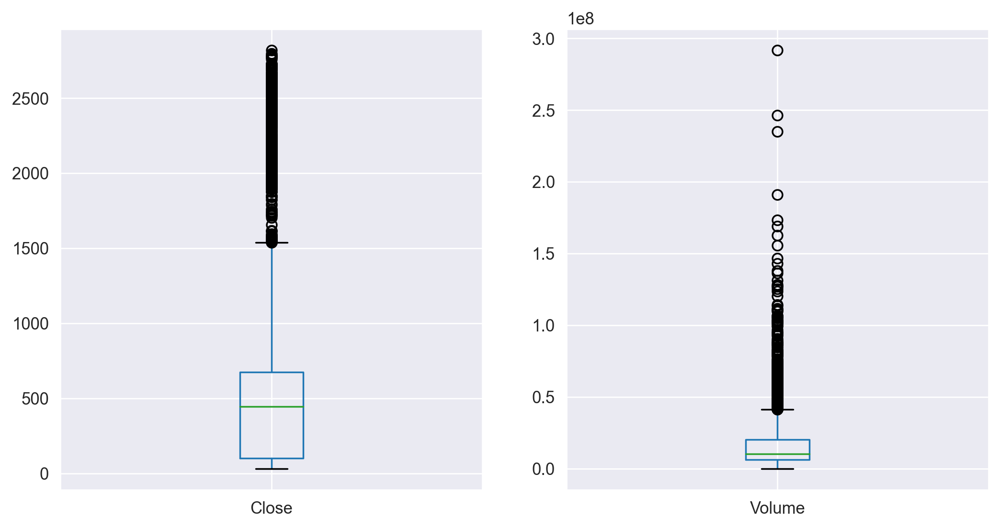

In [17]:
#Checking outliers using boxplot

plt.subplot(121)
data[['Close']].boxplot()
plt.subplot(122)
data[['Volume']].boxplot()

In [18]:
#Checking percentage of outliers present in dataset.

print("Outliers present in 'Close' = ", len(data[data['Close'] > 1455.29]))
print("% of outlier present in 'Close' = ", "%s%%"%round(((704/5755)*100), 2))
print("\n")
print("Outliers present in 'Volume' = ", len(data[data['Volume'] > 41303642.5]))
print("% of outlier present in 'Close' = ", "%s%%"%round(((470/5755)*100), 2))

Outliers present in 'Close' =  715
% of outlier present in 'Close' =  12.23%


Outliers present in 'Volume' =  470
% of outlier present in 'Close' =  8.17%


Text(0.5, 1.0, 'Close')

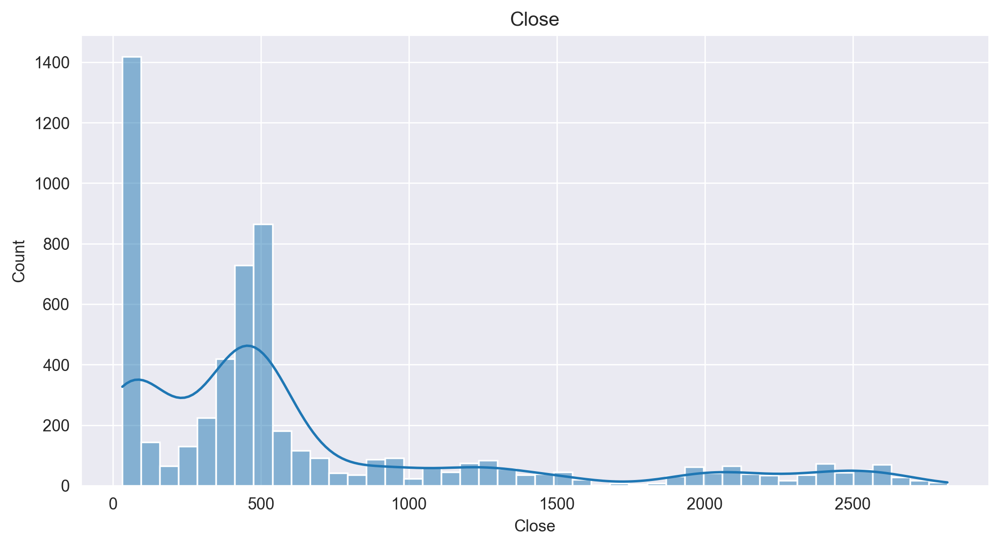

In [19]:
#Checking data distribution for 'ADJ CLOSE' column using histogram

sns.histplot(data['Close'], kde = True);
plt.title('Close')

Text(0.5, 1.0, 'Volume')

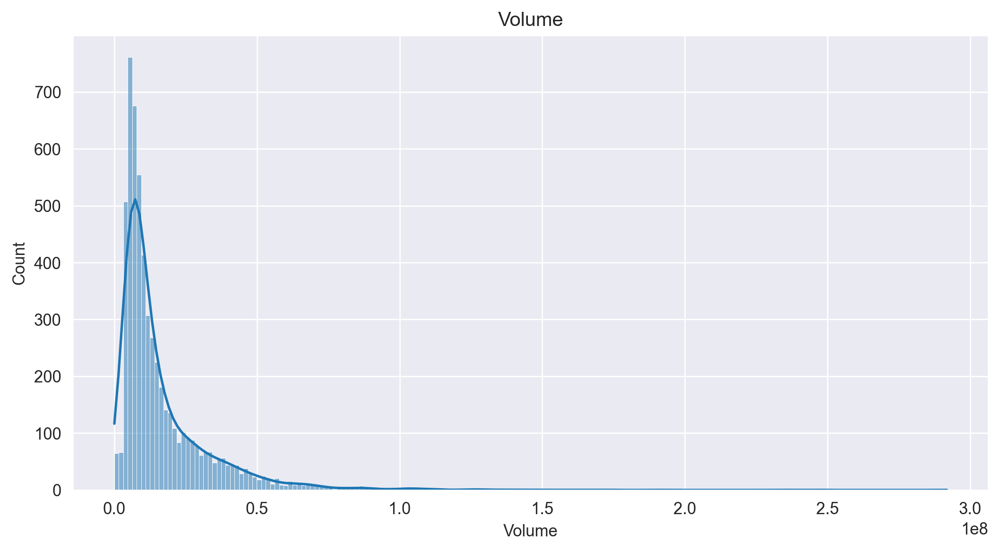

In [20]:
#Checking data distribution for 'VOLUME' column using histogram

sns.histplot(data['Volume'],kde = True)
plt.title('Volume')

# Transformation

In [21]:
#Applying log transformation to remove outliers and to get normal distribution.

data['log_Close'] = np.log(data['Close'])
data['log_Volume'] = np.log(data['Volume'])
data.head()

,Open,High,Low,Close,Adj Close,Volume,Month,Year,log_Close,log_Volume
Date,,,,,,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,29.684193,28802010.0,Jan,2000,3.662139,17.175956
2000-01-04,39.981236,42.062302,38.882679,42.062302,32.060585,61320457.0,Jan,2000,3.739152,17.931624
2000-01-05,39.710464,44.545658,39.710464,43.710136,33.316597,173426953.0,Jan,2000,3.777580,18.971267
2000-01-06,44.715855,46.526150,44.715855,45.543640,34.714115,101355113.0,Jan,2000,3.818671,18.434141
2000-01-07,45.644211,49.187443,45.334759,48.669109,37.096405,128426756.0,Jan,2000,3.885045,18.670869


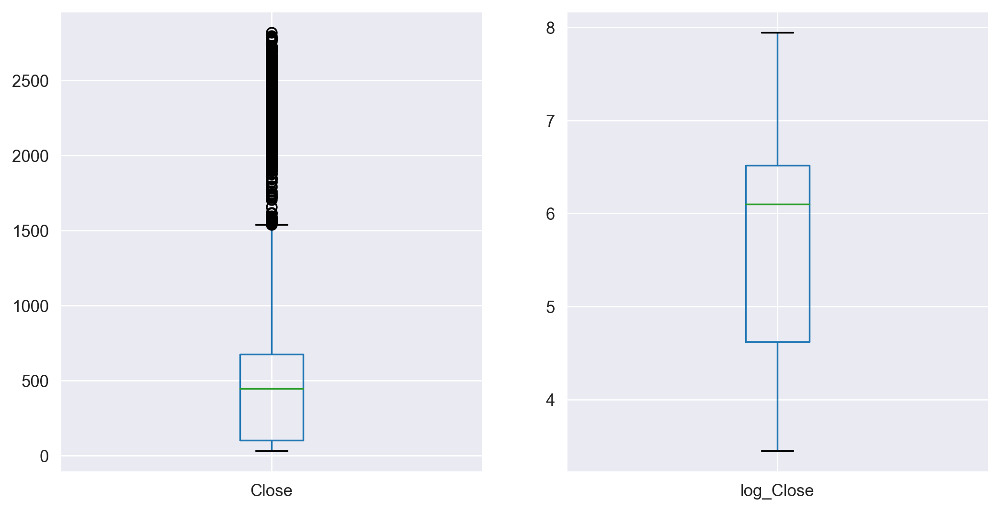

In [22]:
#Boxplot after apllying log transformation on 'Adj Close'

plt.subplot(121)
data[['Close']].boxplot()
plt.subplot(122)
data[['log_Close']].boxplot();

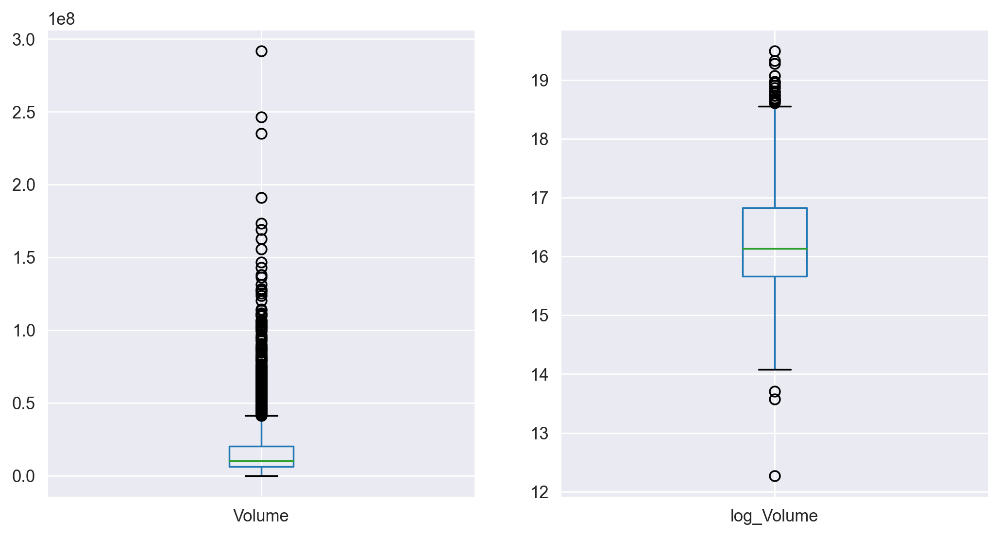

In [23]:
#Boxplot after applying log transformation on 'Volume'.

plt.subplot(121)
data[['Volume']].boxplot()
plt.subplot(122)
data[['log_Volume']].boxplot();

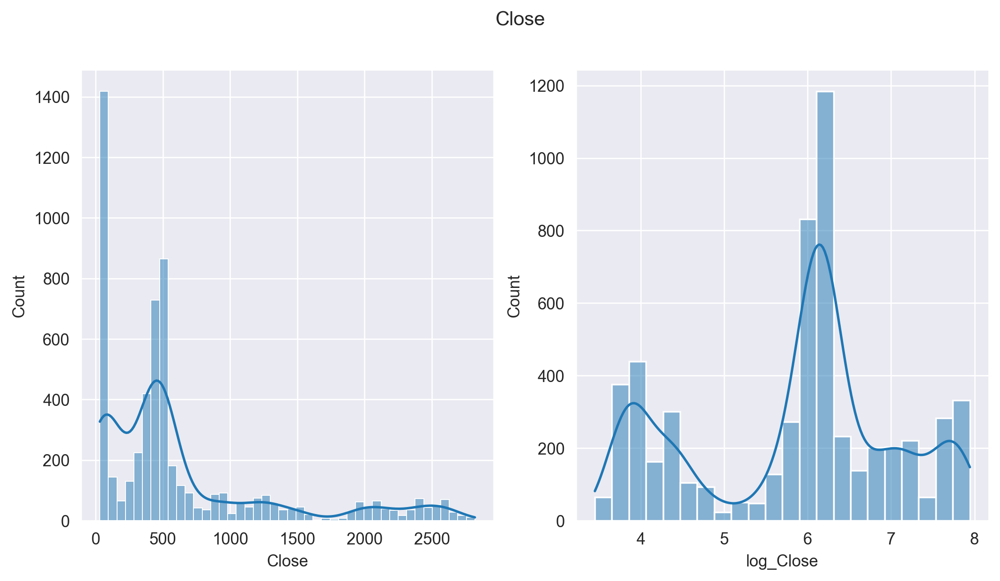

In [24]:
#Distribution of data before and after log transformation.

plt.suptitle('Close')
plt.subplot(121)
sns.histplot(data['Close'], kde=True)
plt.subplot(122)
sns.histplot(data['log_Close'], kde=True);

# Finding long-term and short-term trends
## Moving Average

In [25]:
data_ma=data.copy()
data_ma['30-day MA']=data['Close'].rolling(window=30).mean()
data_ma['200-day MA']=data['Close'].rolling(window=200).mean()
data_ma

,Open,High,Low,Close,Adj Close,Volume,Month,Year,log_Close,log_Volume,30-day MA,200-day MA
Date,,,,,,,,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,29.684193,28802010.0,Jan,2000,3.662139,17.175956,NaN,NaN
2000-01-04,39.981236,42.062302,38.882679,42.062302,32.060585,61320457.0,Jan,2000,3.739152,17.931624,NaN,NaN
2000-01-05,39.710464,44.545658,39.710464,43.710136,33.316597,173426953.0,Jan,2000,3.777580,18.971267,NaN,NaN
2000-01-06,44.715855,46.526150,44.715855,45.543640,34.714115,101355113.0,Jan,2000,3.818671,18.434141,NaN,NaN
2000-01-07,45.644211,49.187443,45.334759,48.669109,37.096405,128426756.0,Jan,2000,3.885045,18.670869,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2524.050049,2764496.0,Dec,2022,7.833620,14.832369,2618.376693,2556.113508
2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2544.699951,2659749.0,Dec,2022,7.841768,14.793742,2616.290023,2557.659508
2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,2544.449951,3442509.0,Dec,2022,7.841670,15.051711,2614.693351,2558.611257


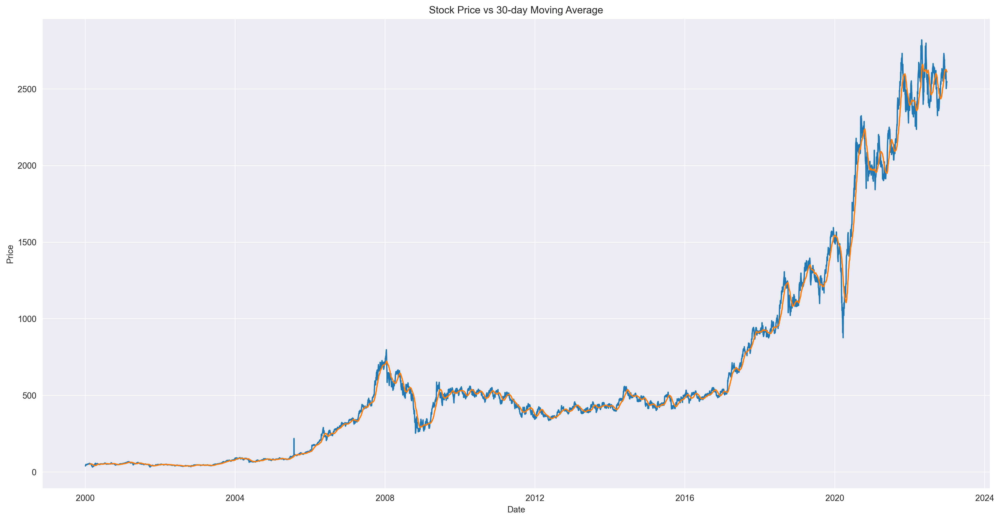

In [26]:
plt.figure(figsize=(20,10))
plt.plot(data_ma['Close'],label='Original data')
plt.plot(data_ma['30-day MA'],label='30-MA')
plt.legend
plt.title('Stock Price vs 30-day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

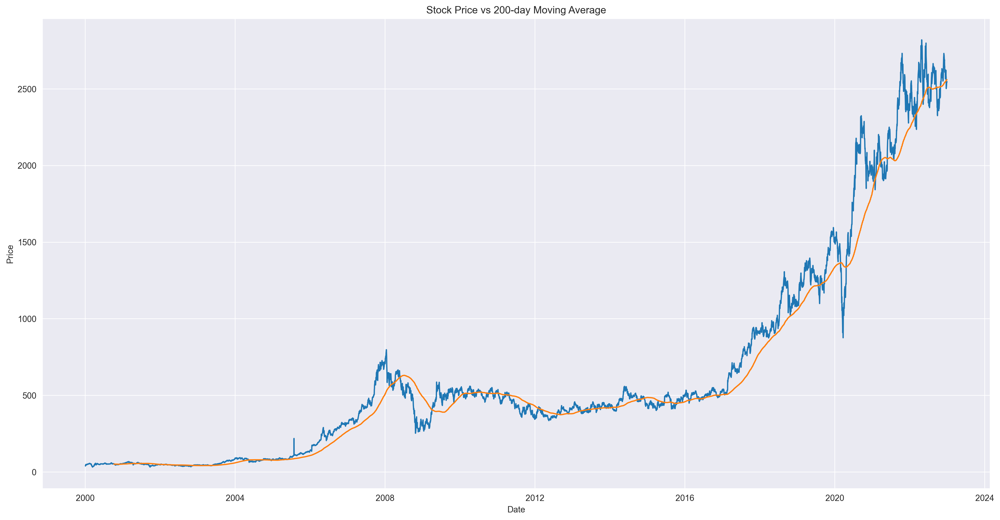

In [27]:
plt.figure(figsize=(20,10))
plt.plot(data_ma['Close'],label='Original data')
plt.plot(data_ma['200-day MA'],label='200-MA')
plt.legend
plt.title('Stock Price vs 200-day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

Long term and short term trends can be identified using the Moving Average graphs

# Model Building

In [28]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score 
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM, GRU

from itertools import cycle

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [29]:
data

,Open,High,Low,Close,Adj Close,Volume,Month,Year,log_Close,log_Volume
Date,,,,,,,,,,
2000-01-03,36.747459,38.944569,36.747459,38.944569,29.684193,28802010.0,Jan,2000,3.662139,17.175956
2000-01-04,39.981236,42.062302,38.882679,42.062302,32.060585,61320457.0,Jan,2000,3.739152,17.931624
2000-01-05,39.710464,44.545658,39.710464,43.710136,33.316597,173426953.0,Jan,2000,3.777580,18.971267
2000-01-06,44.715855,46.526150,44.715855,45.543640,34.714115,101355113.0,Jan,2000,3.818671,18.434141
2000-01-07,45.644211,49.187443,45.334759,48.669109,37.096405,128426756.0,Jan,2000,3.885045,18.670869
...,...,...,...,...,...,...,...,...,...,...
2022-12-26,2514.750000,2542.000000,2492.399902,2524.050049,2524.050049,2764496.0,Dec,2022,7.833620,14.832369
2022-12-27,2530.000000,2548.800049,2515.250000,2544.699951,2544.699951,2659749.0,Dec,2022,7.841768,14.793742
2022-12-28,2538.000000,2549.800049,2521.500000,2544.449951,2544.449951,3442509.0,Dec,2022,7.841670,15.051711


In [30]:
# Creating dataframe which only includes date and close.

close_df=pd.DataFrame(data['Close'])
close_df

,Close
Date,
2000-01-03,38.944569
2000-01-04,42.062302
2000-01-05,43.710136
2000-01-06,45.543640
2000-01-07,48.669109
...,...
2022-12-26,2524.050049
2022-12-27,2544.699951
2022-12-28,2544.449951


In [31]:
print(close_df.shape)


close_df=close_df.reset_index()

(5745, 1)


In [32]:
close_df['Date']

0      2000-01-03
1      2000-01-04
2      2000-01-05
3      2000-01-06
4      2000-01-07
          ...    
5740   2022-12-26
5741   2022-12-27
5742   2022-12-28
5743   2022-12-29
5744   2022-12-30
Name: Date, Length: 5745, dtype: datetime64[ns]

## Normalizing / scaling close value between 0 to 1


In [33]:
close_stock = close_df.copy()
del close_df['Date']
scaler=MinMaxScaler(feature_range=(0,1))
closedf=scaler.fit_transform(np.array(close_df).reshape(-1,1))
print(closedf.shape)

(5745, 1)


## Split data for training and testing
- Ratio for training and testing data is 86:14

In [34]:
training_size=int(len(closedf)*0.86)
test_size=len(closedf)-training_size
train_data,test_data=closedf[0:training_size,:],closedf[training_size:len(closedf),:1]
print("train_data: ", train_data.shape)
print("test_data: ", test_data.shape)

train_data:  (4940, 1)
test_data:  (805, 1)


## Create new dataset according to requirement of time-series prediction

In [35]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [36]:
# reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 13
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)
print("X_test: ", X_test.shape)
print("y_test", y_test.shape)

X_train:  (4926, 13)
y_train:  (4926,)
X_test:  (791, 13)
y_test (791,)


# Algorithms

## LSTM

In [37]:
import math

# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (4926, 13, 1)
X_test:  (791, 13, 1)


## LSTM model structure

In [38]:
tf.keras.backend.clear_session()
model=Sequential()
model.add(LSTM(32,return_sequences=True,input_shape=(time_step,1)))
model.add(LSTM(32,return_sequences=True))
model.add(LSTM(32))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')

In [39]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 13, 32)         │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 13, 32)         │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,025 (82.13 KB)

 Trainable params: 21,025 (82.13 KB)

 Non-trainable params: 0 (0.00 B)

In [40]:
model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=100,batch_size=32,verbose=1)

Epoch 1/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.0037 - val_loss: 0.0044
Epoch 2/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 8.4285e-05 - val_loss: 0.0053
Epoch 3/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 8.7666e-05 - val_loss: 0.0048
Epoch 4/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 9.7349e-05 - val_loss: 0.0044
Epoch 5/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 7.8285e-05 - val_loss: 0.0060
Epoch 6/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 8.3287e-05 - val_loss: 0.0033
Epoch 7/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 7.3485e-05 - val_loss: 0.0029
Epoch 8/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 8.8114e-05 - val_loss: 0.0035
Epoch 9/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 6.7486e-05 - val_loss: 0.0045
Epoch 10/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 7.8216e-05 - val_loss: 0.0022
Epoch 11/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 7.6870e-05 - val_lo

154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 1.7173e-05 - val_loss: 0.0015
Epoch 66/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 1.7861e-05 - val_loss: 0.0023
Epoch 67/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 1.8681e-05 - val_loss: 0.0012
Epoch 68/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 1.4987e-05 - val_loss: 0.0014
Epoch 69/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 1.5420e-05 - val_loss: 0.0020
Epoch 70/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 1.5314e-05 - val_loss: 0.0010
Epoch 71/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 2.3462e-05 - val_loss: 0.0025
Epoch 72/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 1.5642e-05 - val_loss: 0.0016
Epoch 73/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 1.6941e-05 - val_loss: 0.0021
Epoch 74/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 1.9201e-05 - val_loss: 0.0011
Epoch 75/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 1.5377e-05 - val_los

In [41]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict.shape, test_predict.shape

154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


((4926, 1), (791, 1))

In [42]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

 # Evaluation metrices RMSE, MSE and MAE
Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [43]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Train data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  10.440753147738882
Train data MSE:  109.00932629201938
Train data MAE:  7.2779606491397395
-------------------------------------------------------------------------------------
Test data RMSE:  117.94667917152474
Test data MSE:  13911.419127590587
Test data MAE:  97.19925596975742


## Explained variance regression score
The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [44]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9990022838668052
Test data explained variance regression score: 0.9699058178544874


## R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best 0 or < 0 = worse

In [45]:
train_r2_lstm=r2_score(original_ytrain, train_predict)
test_r2_lstm=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_lstm)
print("Test data R2 score:", test_r2_lstm)

Train data R2 score: 0.9988728025454371
Test data R2 score: 0.9247988923126882


## Comparision between original stock close price vs predicted close price

In [46]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='gray', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5745, 1)
Test predicted data:  (5745, 1)


## Predicting next 30 days

In [47]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input = x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        
        yhat = model.predict(x_input, verbose=0)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model.predict(x_input, verbose=0)
        temp_input.extend(yhat[0].tolist())
        
        lst_output.extend(yhat.tolist())
        i=i+1
               
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


### Plotting last 15 days and next predicted 30 days

In [48]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [49]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='light pink', font_size=15, font_color='black',legend_title_text='Close Price')

fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()


## Plotting whole closing stock price with prediction

In [50]:
lstmdf=closedf.tolist()
lstmdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
lstmdf=scaler.inverse_transform(lstmdf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])

fig = px.line(lstmdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')

fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

## GRU (Gated Recurrent Unit)

In [51]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (4926, 13, 1)
X_test:  (791, 13, 1)


In [52]:
tf.keras.backend.clear_session()
model=Sequential()
model.add(GRU(32,return_sequences=True,input_shape=(time_step,1)))
model.add(GRU(32,return_sequences=True))
model.add(GRU(32,return_sequences=True))
model.add(GRU(32))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')

In [53]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru (GRU)                       │ (None, 13, 32)         │         3,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 13, 32)         │         6,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_2 (GRU)                     │ (None, 13, 32)         │         6,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_3 (GRU)                     │ (None, 32)             │         6,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,401 (87.50 KB)

 Trainable params: 22,401 (87.50 KB)

 Non-trainable params: 0 (0.00 B)

In [54]:
model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=100,batch_size=32,verbose=1)

Epoch 1/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 24s 51ms/step - loss: 0.0048 - val_loss: 0.0014
Epoch 2/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 6.3772e-05 - val_loss: 0.0013
Epoch 3/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 5.5960e-05 - val_loss: 0.0016
Epoch 4/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - loss: 5.1610e-05 - val_loss: 8.8958e-04
Epoch 5/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 6.2266e-05 - val_loss: 9.9990e-04
Epoch 6/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 4.9937e-05 - val_loss: 0.0013
Epoch 7/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 4.9862e-05 - val_loss: 0.0012
Epoch 8/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 3.6457e-05 - val_loss: 0.0011
Epoch 9/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 3.6452e-05 - val_loss: 4.8365e-04
Epoch 10/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 3.9571e-05 - val_loss: 6.4338e-04
Epoch 11/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 3.4

154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 1.4966e-05 - val_loss: 0.0022
Epoch 65/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 2.3981e-05 - val_loss: 0.0013
Epoch 66/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 1.5559e-05 - val_loss: 0.0015
Epoch 67/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 1.6747e-05 - val_loss: 0.0015
Epoch 68/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 1.9884e-05 - val_loss: 0.0018
Epoch 69/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 1.8704e-05 - val_loss: 0.0028
Epoch 70/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 1.7258e-05 - val_loss: 0.0029
Epoch 71/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 1.7841e-05 - val_loss: 0.0017
Epoch 72/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 1.7457e-05 - val_loss: 0.0013
Epoch 73/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 2.7481e-05 - val_loss: 0.0021
Epoch 74/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 1.6245e-05 - val_los

In [55]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict.shape, test_predict.shape

154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


((4926, 1), (791, 1))

In [56]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1))

# Evaluation metrices RMSE, MSE and MAE
Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [57]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  10.763994340168058
Train data MSE:  115.86357415516997
Test data MAE:  6.614476384465232
-------------------------------------------------------------------------------------
Test data RMSE:  164.9584409908119
Test data MSE:  27211.287254119172
Test data MAE:  140.9457227935317


# Explained variance regression score
The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [58]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9989369895324847
Test data explained variance regression score: 0.9562592310160093


 ## R2 score for regression
R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best 0 or < 0 = worse

In [59]:
train_r2_gru=r2_score(original_ytrain, train_predict)
test_r2_gru=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_gru)
print("Test data R2 score:", test_r2_gru)

Train data R2 score: 0.9988019270432476
Test data R2 score: 0.8529036524355076


## Comparision between original stock close price vs predicted close price

In [60]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)


names = cycle(['Original close price','Train predicted close price','Test predicted close price'])

plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['Close'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (5745, 1)
Test predicted data:  (5745, 1)


In [61]:
plotdf.head(100)

,Date,original_close,train_predicted_close,test_predicted_close
0,2000-01-03,38.944569,NaN,NaN
1,2000-01-04,42.062302,NaN,NaN
2,2000-01-05,43.710136,NaN,NaN
3,2000-01-06,45.543640,NaN,NaN
4,2000-01-07,48.669109,NaN,NaN
...,...,...,...,...
95,2000-05-15,49.435001,49.253735,NaN
96,2000-05-16,49.110077,49.714020,NaN
97,2000-05-17,49.334431,49.475971,NaN
98,2000-05-18,47.980576,49.571522,NaN


# Predicting next 30 days

In [62]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 30
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input = x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        
        yhat = model.predict(x_input, verbose=0)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model.predict(x_input, verbose=0)
        temp_input.extend(yhat[0].tolist())
        
        lst_output.extend(yhat.tolist())
        i=i+1
               
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  30


# Plotting last 15 days and next predicted 30 days

In [63]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43]


In [64]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})
names = cycle(['Last 15 days close price','Predicted next 30 days close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 15 days vs next 30 days',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

## Plotting whole closing stock price with prediction

In [65]:
grudf=closedf.tolist()
grudf.extend((np.array(lst_output).reshape(-1,1)).tolist())
grudf=scaler.inverse_transform(grudf).reshape(1,-1).tolist()[0]

names = cycle(['Close price'])
fig = px.line(grudf,labels={'value': 'Stock price','index':'Timpstamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [66]:
finaldf = pd.DataFrame({'lstm':lstmdf,'gru':grudf,})
finaldf

,lstm,gru
0,38.944569,38.944569
1,42.062302,42.062302
2,43.710136,43.710136
3,45.543640,45.543640
4,48.669109,48.669109
...,...,...
5770,1580.803429,1229.284920
5771,1572.994586,1218.305771
5772,1565.648782,1207.781849
5773,1558.732279,1197.677339


# Conclusion Chart

In [67]:
names = cycle(['LSTM','GRU'])

fig = px.line(finaldf[225:], x=finaldf.index[225:], y=[finaldf['lstm'][225:],finaldf['gru'][225:],],
             labels={'x': 'Timestamp','value':'Stock close price'})
fig.update_layout(title_text='Final stock analysis chart',plot_bgcolor='pink' ,font_size=15, font_color='black',legend_title_text='Algorithms')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

In [68]:
data={"Model": [ "LSTM", "GRU"],
    "Train R2 Score": [train_r2_lstm, train_r2_gru],
    "Test R2 Score": [test_r2_lstm, test_r2_gru]}
df=pd.DataFrame(data)
df

,Model,Train R2 Score,Test R2 Score
0,LSTM,0.998873,0.924799
1,GRU,0.998802,0.852904


### By Looking into this table we can say that our LSTM model have best R2 score.
### so we are going to use LSTM model for our deployment part.

# Saving the trained model

In [70]:
import pickle

In [71]:
filename = 'trained_model.sav'
pickle.dump (model, open(filename,'wb'))

In [72]:
#loading the saved model
loaded_model = pickle.load(open('trained_model.sav','rb'))

In [75]:
### Lets Do the prediction and check performance metrics
train_predict=loaded_model(X_train)
test_predict=loaded_model(X_test)
train_predict.shape, test_predict.shape

(TensorShape([4926, 1]), TensorShape([791, 1]))